## О данных

Будем работать с [датасетом физической активности](https://www.kaggle.com/datasets/uciml/human-activity-recognition-with-smartphones). 

В этом датасете собраны данные 30 человек, выполняющих различные действия со смартфоном на поясе. Данные записывались с помощью датчиков (акселерометра и гироскопа) в этом смартфоне. Были зафиксированы: "3-осевое линейное ускорение" (_tAcc-XYZ_) и "3-осевая угловая скорость" (_tGyro-XYZ_).

1. Все сигналы отсортированы по времени, пропущены через фильтр шума.
2. Все наблюдения были разделены на окна по 128 сигналов в каждом, причем окна пересекаются на 50% (грубо говоря, с 1 по 128 сигнал в 1 окно, с 64 до 192 сигнала - во 2 окно и так далее).
3. Линейное ускорение было разделено на две составляющие (с помощью низкочастотного фильтра): ускорение самого тела, а также гравитационная составляющая. Будем называть их ускорением тела и гравитационным ускорением.
4. К получившимся окнам применяли различные функции для получения следующих показателей:
    - max
    - min
    - mad (median)
    - mean
    - std
    - skewness (коэффициент асимметричности распределения признака в окне)
    - etc. (подробнее, на сколько это возможно, указано на [страничке датасета](https://archive.ics.uci.edu/dataset/240/human+activity+recognition+using+smartphones))
5. Величина (magnitude) сигнала также определялась через евклидову норму всех значений из вектора для одного окна.
6. К окнам было применено преобразование Фурье, чтобы получить частоты. Из частот были извелченыте же показатели, плюс новые:
    - bandsEnergy (энергия частотного интервала)
7. Были посчитаны углы между векторами соответствующих окон.
8. Для ускорений были посчитаны производные - рывки, к которым применялись те же функции.

Итог: в датасете каждый признак - это какая-то операция над вектором из 128 чисел, которые соответствуют замерам определенного человека занятого какой-то активностью на протяжении 2.56 секунд.

Как читать названия признаков? Примеры:
- `tBodyAccMag-mean()` - это вектор ускорений тела (без гравитационной составляющей этого ускорения), из которого взяли евклидову норму, а затем усреднили, чтобы получить скаляр
- `fBodyAcc-bandsEnergy()-1,8.2` - это вектор ускорения тела, к которому применили преобразование Фурье, преобразовав его в вектор частот, а затем посчитали на этом векторе энергию данного частотного интервала в определенном диапазоне частот (в данном случае 1 - 8.2)
- `angle(X,gravityMean)` - это угол между осью Х и вектором усредненных значений гравитационного ускорения из соответствующего окна

## Предобработка данных

In [ ]:
!pip install opendatasets

In [2]:
import opendatasets as od

#Пожалуйста, загрузите ваш kaggle.jason в рабочую директорию, чтобы все сработало

dataset = 'https://www.kaggle.com/datasets/uciml/human-activity-recognition-with-smartphones'

od.download(dataset)

100%|██████████| 24.5M/24.5M [00:57<00:00, 446kB/s]


In [2]:
import os
data_dir = '.\human-activity-recognition-with-smartphones'
os.listdir(data_dir)

['test.csv', 'train.csv']

In [3]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

import warnings
warnings.filterwarnings("ignore")

In [4]:
train = pd.read_csv(os.path.join('human-activity-recognition-with-smartphones', 'train.csv'))
test = pd.read_csv(os.path.join('human-activity-recognition-with-smartphones', 'test.csv'))

In [5]:
train.shape

(7352, 563)

В датасете 563 признака, включая целевую переменную. Столько признаков нам не нужно. Сделаем подвыборку признаков для удобства работы с ними.

In [6]:
cols_subset = [
    'tBodyAccMag-mean()',  # усредненная величина ускорения тела
    'tBodyGyroJerk-mad()-X',  # медианная величина рывка тела по оси Х
    'tGravityAcc-min()-X',  # минимум гравитационной составляющей ускорения по оси Х
    'tBodyAcc-max()-X',  # максимальная величина ускорения тела по оси Х
    'fBodyAcc-bandsEnergy()-1,8.2',  # энергия ускорения тела в интервале частоты
    'angle(X,gravityMean)',  # угол между осью Х и усредненной гравитационной составляющей ускорения
    'angle(Y,gravityMean)',  # угол между осью Y и усредненной гравитационной составляющей ускорения
    'angle(Z,gravityMean)',  # угол между осью Z и усредненной гравитационной составляющей ускорения,
    'fBodyAcc-skewness()-X',  # асимметричность частоты ускорения тела по оси Х
    'subject',  # номер испытуемого
    'Activity',  # название вида деятельности (целевая переменная)
]

In [7]:
train = train[cols_subset]
test = test[cols_subset]

Посмотрим на пропуски и дубли в данных train и test

In [8]:
train.isna().sum() 

tBodyAccMag-mean()              0
tBodyGyroJerk-mad()-X           0
tGravityAcc-min()-X             0
tBodyAcc-max()-X                0
fBodyAcc-bandsEnergy()-1,8.2    0
angle(X,gravityMean)            0
angle(Y,gravityMean)            0
angle(Z,gravityMean)            0
fBodyAcc-skewness()-X           0
subject                         0
Activity                        0
dtype: int64

In [9]:
train.duplicated().sum()

0

In [10]:
test.isna().sum() 

tBodyAccMag-mean()              0
tBodyGyroJerk-mad()-X           0
tGravityAcc-min()-X             0
tBodyAcc-max()-X                0
fBodyAcc-bandsEnergy()-1,8.2    0
angle(X,gravityMean)            0
angle(Y,gravityMean)            0
angle(Z,gravityMean)            0
fBodyAcc-skewness()-X           0
subject                         0
Activity                        0
dtype: int64

In [11]:
test.duplicated().sum()

0

Таким образом, нет ни пропусков, ни дубликатов

In [12]:
train

,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject,Activity
0,-0.959434,-0.992165,0.977436,-0.934724,-0.993592,-0.841247,0.179941,-0.058627,0.142051,1,STANDING
1,-0.979289,-0.989876,0.984520,-0.943068,-0.998235,-0.844788,0.180289,-0.054317,-0.692541,1,STANDING
2,-0.983703,-0.987868,0.986770,-0.938692,-0.999388,-0.848933,0.180637,-0.049118,-0.727227,1,STANDING
3,-0.986542,-0.991241,0.986821,-0.938692,-0.999807,-0.848649,0.181935,-0.047663,-0.599118,1,STANDING
4,-0.992827,-0.992882,0.987434,-0.942469,-0.999806,-0.847865,0.185151,-0.043892,-0.676997,1,STANDING
...,...,...,...,...,...,...,...,...,...,...,...
7347,-0.031719,-0.533656,0.920554,0.210795,-0.274644,-0.791883,0.238604,0.049819,-0.154387,30,WALKING_UPSTAIRS
7348,-0.065256,-0.609540,0.920554,0.117440,-0.310596,-0.771840,0.252676,0.050053,-0.053694,30,WALKING_UPSTAIRS
7349,-0.003936,-0.662918,0.933008,0.043999,0.034897,-0.779133,0.249145,0.040811,0.363110,30,WALKING_UPSTAIRS
7350,-0.002445,-0.645452,0.933008,0.101702,0.040506,-0.785181,0.246432,0.025339,0.382837,30,WALKING_UPSTAIRS


Найдем основные статистики данных: среднее, медиана, перцентили (0.25, 0.5, 0.75), минимум, максимум, стандартное отклонение.

In [14]:
X = train.describe().drop("count", axis=0)
X.loc['median'] = list(train.median())
X

,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject
mean,-0.543884,-0.727735,0.678505,-0.468604,-0.847963,-0.489547,0.058593,-0.056515,-0.128562,17.413085
std,0.477653,0.315832,0.508656,0.544547,0.233633,0.511807,0.297480,0.279122,0.403686,8.975143
min,-1.000000,-0.999889,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-1.000000,-0.931208,1.000000
25%,-0.983282,-0.991595,0.804270,-0.936219,-0.999480,-0.812065,-0.017885,-0.143414,-0.486841,8.000000
50%,-0.883371,-0.950268,0.926693,-0.881637,-0.986582,-0.709417,0.182071,0.003181,-0.163271,19.000000
75%,-0.106892,-0.474625,0.965095,-0.017129,-0.764508,-0.509079,0.248353,0.107659,0.155112,26.000000
max,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,0.478157,1.000000,1.000000,30.000000
median,-0.883371,-0.950268,0.926693,-0.881637,-0.986582,-0.709417,0.182071,0.003181,-0.163271,19.000000


Так, из общих инсайтов (не знаю пока насколько интересных):
    
1) Все показатели в пределах [-1;1] (за исключением subject, очевидно), что говорит о нормировке. Возможно из условия задания, это и так было очевидно, но не мне

2) Усредненная величина ускорения тела. Можем заметить, что 75% значений сконцентрировано в первой половине интервала, я, конечно, даже близко не физик, но если предположить, что, чем больше показатель, тем выше уровень ускорения, то можно сказать, что каких-то массово высоких значений ускорения не наблюдалось, то есть были те наблюдения, для которых показатели ускорения высоки, но большая часть от этих наблюдений сильно отличалась.

3) Минимум гравитационной составляющей по оси OX. Как можем заметить, что для половины наблюдений двольное большую часть ускорения составляет гравитационное ускорение

Данные сбалансированы? У нас есть 6 категорий активности (целевая переменная). Если одна из категорий представлена большим количеством наблюдений, а остальные - нет, то это обстоятельство, о котором хотелось бы знать заранее. Гиперболизированный пример: представьте, что у вас 1000 наблюдений, разделенных на два класса, и только 5 принадлежат ко второму классу. Как учить модель на такой выборке? Есть сильное подозрение, что многие модели будут склонны вырождаться в константу. Отсюда и необходимость проверять баланс классов.

Найдем количество наблюдений для всех категорий активности в train и test. Посчитаем разницу в процентах между самой крупной категорией и самой маленькой (самая большая категория - это 100%). Если разница (округленная до ближайшего целого числа) не превышает 30%, то давайте для наших целей считать, что данные сбалансированы.

In [15]:
train.head()

,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject,Activity
0,-0.959434,-0.992165,0.977436,-0.934724,-0.993592,-0.841247,0.179941,-0.058627,0.142051,1,STANDING
1,-0.979289,-0.989876,0.984520,-0.943068,-0.998235,-0.844788,0.180289,-0.054317,-0.692541,1,STANDING
2,-0.983703,-0.987868,0.986770,-0.938692,-0.999388,-0.848933,0.180637,-0.049118,-0.727227,1,STANDING
3,-0.986542,-0.991241,0.986821,-0.938692,-0.999807,-0.848649,0.181935,-0.047663,-0.599118,1,STANDING
4,-0.992827,-0.992882,0.987434,-0.942469,-0.999806,-0.847865,0.185151,-0.043892,-0.676997,1,STANDING


Для train:

In [16]:
train['Activity'].value_counts()

LAYING                1407
STANDING              1374
SITTING               1286
WALKING               1226
WALKING_UPSTAIRS      1073
WALKING_DOWNSTAIRS     986
Name: Activity, dtype: int64

In [17]:
diff = round((1407 - 986)/1407*100)

print(f'Разница между самой крупной категорией и самой маленькой в train: {diff} %')

Разница между самой крупной категорией и самой маленькой в train: 30 %


In [18]:
test['Activity'].value_counts()

LAYING                537
STANDING              532
WALKING               496
SITTING               491
WALKING_UPSTAIRS      471
WALKING_DOWNSTAIRS    420
Name: Activity, dtype: int64

In [19]:
diff = round((537 - 420)/537*100)

print(f'Разница между самой крупной категорией и самой маленькой в test: {diff} % - ')

Разница между самой крупной категорией и самой маленькой в test: 22 % - 


Таким образом, обе выборки сбалансирваны

Посчитаем корреляции всех признаков (включая таргет) со всеми другими. Какими получились значения? Есть идеи, почему так? Напишите ваши мысли.

In [20]:
train_numeric = pd.get_dummies(train, columns=["Activity"], drop_first=True)
train_numeric.corr()

,tBodyAccMag-mean(),tBodyGyroJerk-mad()-X,tGravityAcc-min()-X,tBodyAcc-max()-X,"fBodyAcc-bandsEnergy()-1,8.2","angle(X,gravityMean)","angle(Y,gravityMean)","angle(Z,gravityMean)",fBodyAcc-skewness()-X,subject,Activity_SITTING,Activity_STANDING,Activity_WALKING,Activity_WALKING_DOWNSTAIRS,Activity_WALKING_UPSTAIRS
tBodyAccMag-mean(),1.000000,0.899080,0.369962,0.959827,0.697832,-0.370849,0.495561,0.426283,0.379796,-0.073652,-0.396389,-0.414460,0.358825,0.561344,0.405434
tBodyGyroJerk-mad()-X,0.899080,1.000000,0.380118,0.879900,0.507939,-0.382246,0.478567,0.380967,0.266002,-0.110321,-0.379403,-0.370699,0.531695,0.445048,0.257524
tGravityAcc-min()-X,0.369962,0.380118,1.000000,0.380404,0.239088,-0.988663,0.797116,0.667415,-0.261676,-0.042371,0.187055,0.262354,0.234820,0.192409,0.159741
tBodyAcc-max()-X,0.959827,0.879900,0.380404,1.000000,0.613383,-0.384192,0.480229,0.405023,0.335708,-0.055633,-0.387297,-0.399861,0.298526,0.658369,0.347429
"fBodyAcc-bandsEnergy()-1,8.2",0.697832,0.507939,0.239088,0.613383,1.000000,-0.213318,0.363170,0.423927,0.260316,-0.037000,-0.276766,-0.296141,0.189834,0.217399,0.534750
"angle(X,gravityMean)",-0.370849,-0.382246,-0.988663,-0.384192,-0.213318,1.000000,-0.783848,-0.643655,0.265523,0.026137,-0.181082,-0.266279,-0.233903,-0.222029,-0.116118
"angle(Y,gravityMean)",0.495561,0.478567,0.797116,0.480229,0.363170,-0.783848,1.000000,0.594885,-0.046213,-0.009829,-0.096667,0.241314,0.243434,0.186124,0.310982
"angle(Z,gravityMean)",0.426283,0.380967,0.667415,0.405023,0.423927,-0.643655,0.594885,1.000000,-0.183815,-0.098712,-0.065389,0.167701,0.198901,0.162849,0.273889
fBodyAcc-skewness()-X,0.379796,0.266002,-0.261676,0.335708,0.260316,0.265523,-0.046213,-0.183815,1.000000,0.019742,-0.223813,-0.419856,0.024511,0.176759,0.277785
subject,-0.073652,-0.110321,-0.042371,-0.055633,-0.037000,0.026137,-0.009829,-0.098712,0.019742,1.000000,0.029473,0.018212,-0.047385,-0.014201,-0.019371


1) Высокое корреляция между усредненным ускорением и медианным рывком, поскольку рывки - производные ускорения, а так же между ними и максимальны ускорением вдоль OX

2) Так же логичная высокая взаимосвязь между минимальным гравитационными ускорением и углами между осью OX/OY/OZ и усредненной гравитационнной составляющей

4) Высокая корреляция между максимальным ускорением тела по OX и активностью: walking downstairs.

5) Так же можем заметить, что динамичные активности имели большую корреляцию с различными показателями нежели статичные.

Поздравляем! Вы предобработали данные для максимально комфортного их последующего анализа. Теперь вы готовы приступить к Exploratory Data Analysis!

## Exploratory Data Analysis

In [21]:
import numpy as np

Ранее мы уже проверили сбалансированность данных по разным категориям активностей в train и test сетах. Теперь визуализируем количество сэмплов в каждой из категорий отдельно для train и test сетов.

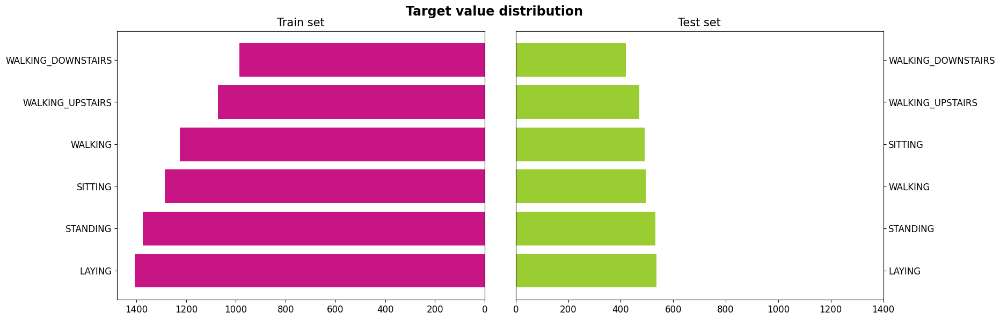

In [23]:
data_0 = dict(train['Activity'].value_counts())
labels_0 = list(data_0.keys())
values_0 = list(data_0.values())

data_1 = dict(test['Activity'].value_counts())
labels_1 = list(data_1.keys())
values_1 = list(data_1.values())

fig, axs = plt.subplots(1, 2, figsize=(15, 6))
plt.suptitle('Target value distribution', fontsize=17, weight='bold')
fig.tight_layout()

axs[0].barh(labels_0, values_0, color='mediumvioletred', label='1')
axs[0].set_title('Train set', fontsize=15)
axs[0].set_xlim(axs[0].get_xlim()[::-1])
axs[0].tick_params(axis='x', labelsize=12)
axs[0].tick_params(axis='y', labelsize=12)

axs[1].barh(labels_1, values_1, color='yellowgreen', label='3')
axs[1].set_title('Test set', fontsize=15)
axs[1].set_xlim([0, 1400])
axs[1].yaxis.tick_right()
axs[1].tick_params(axis='x', labelsize=12)
axs[1].tick_params(axis='y', labelsize=12)

plt.show()

Визуализируем heatmap корреляции.

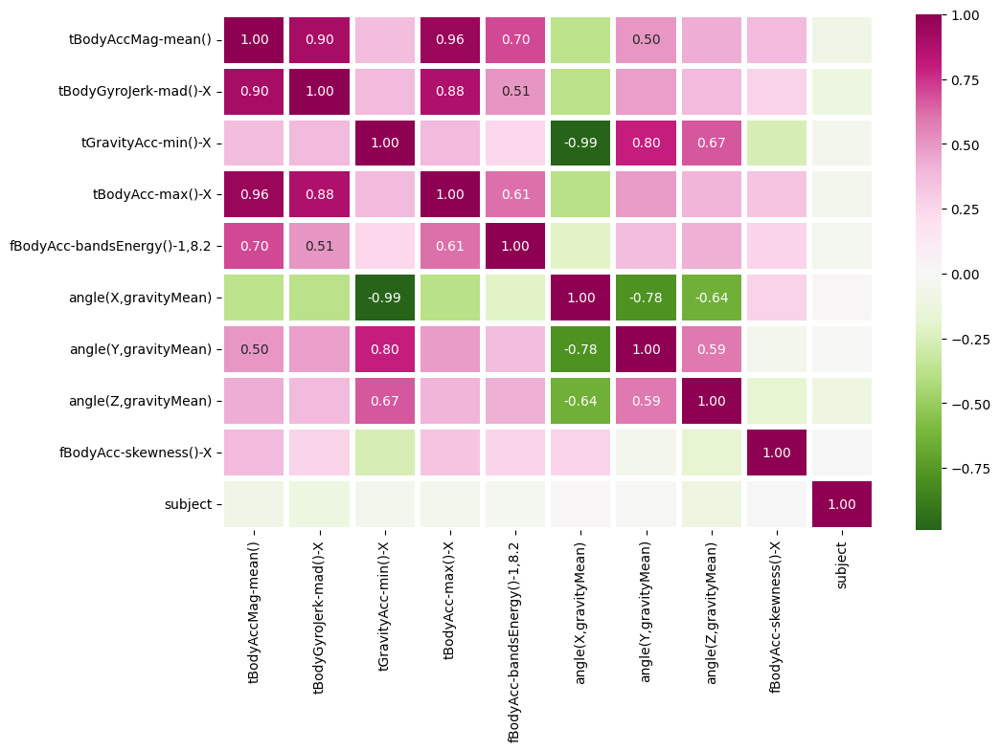

In [24]:
plt.figure(figsize = (11,7))

colormap = plt.cm.PiYG_r
ax = sns.heatmap(train.corr(), cmap=colormap, linewidths=4, annot=True, fmt="0.2f")

for t in ax.texts:
    if abs(float(t.get_text())) >= 0.5:
        t.set_text(t.get_text())
    else:
        t.set_text('')

Из расчета следует исколючить признак subject.

Во-первых, этот признак - порядковая нумерация, его рост не обусловлен изменениями других показателей: сначала может идти человек с хорошей физической подготовкой, затем с плохой, затем снова с хорошей - и даже, если бы связь и была (между тем, чьи именно результаты мы смотрим и собственно результатами), она отражена в любом случае не будет. Если бы мы хотели узнать, как связан конкретный участник с параметрами ускорения и остальными признаками имело бы смысл проранжировать их номера с учетом различных факторов, которые могли влиять на полученные результаты (физическая подготовка участника, рост, вес и т.п.), но даже так рост признака subject будет линеныйм, а, допустим, разница в физической подготовки нет, поэтому все равно будет опредленное искажение. 

Во-вторых, для каждого участника мы будем смотреть разные активности (WALKING, SITTING и т.д.), которые будут влиять на изменения значений остальных признаков, что будет так же искажать взаимосвязь. Поэтому имело бы смысл рассматривать корреляцию между участниками и различными показателями в пределах одной и той же активности.

Выведем pairplot по всем данным train сета.

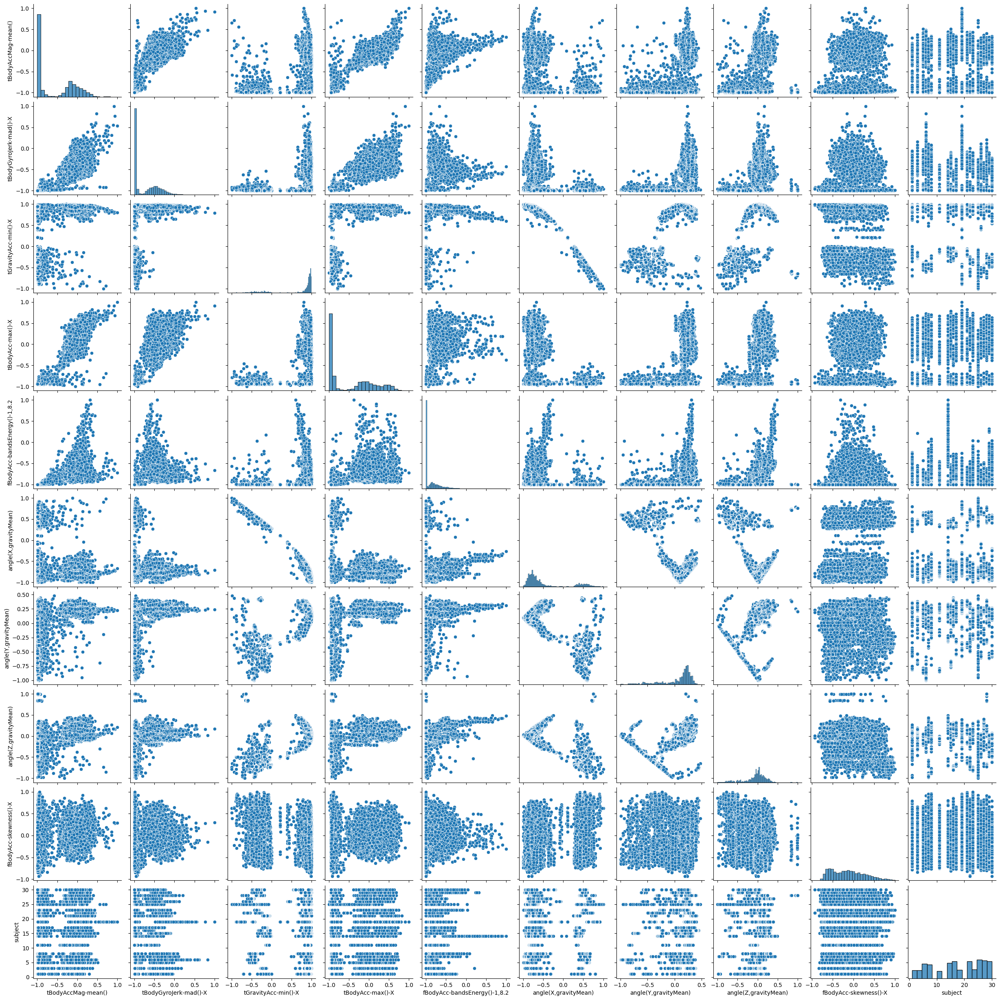

In [25]:
sns.pairplot(train);

Окей. Смотреть на все сразу не очень удобно. Кажется, нужно смотреть на признаки в отдельности и искать в них инсайты.

Попробуем проверить гипотезу. Отобразим плотность распределения (kde) `tBodyAccMag-mean()` для каждой из активностей. И заметим две группы активностей: статистические и динамические. Проведем линию между ними, а затем проверим насколько точно мы способны разделитть эти две группы.

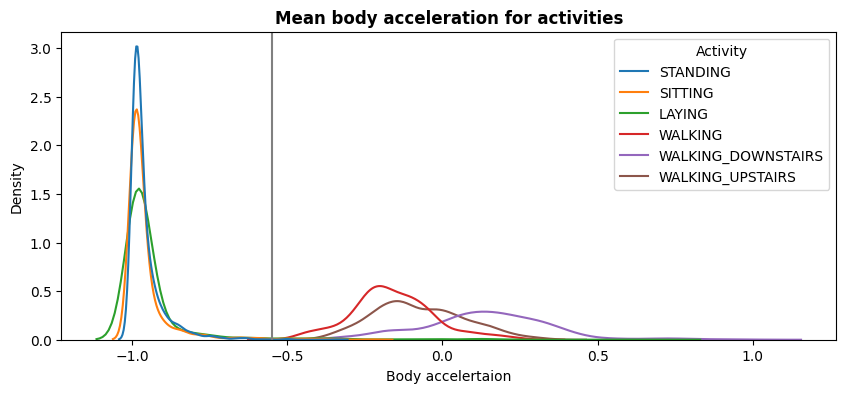

In [26]:
plt.figure(figsize = (10,4))

plt.title('Mean body acceleration for activities', fontsize=12, weight='bold')
sns.kdeplot(train, x='tBodyAccMag-mean()', hue='Activity')
plt.xlabel('Body accelertaion')
plt.axvline(-0.55, c='grey');

In [27]:
options_1 = ['WALKING', 'WALKING_UPSTAIRS', 'WALKING_DOWNSTAIRS']
options_2 = ['LAYING', 'SITTING', 'STANDING']

a = (train['tBodyAccMag-mean()'] > -0.55) & train['Activity'].isin(options_1)
b = (train['tBodyAccMag-mean()'] <= -0.55) & train['Activity'].isin(options_2)
c = a | b

print(c.sum()/train.shape[0])

0.9908868335146899


In [28]:
options_1 = ['WALKING', 'WALKING_UPSTAIRS', 'WALKING_DOWNSTAIRS']
options_2 = ['LAYING', 'SITTING', 'STANDING']

a = (test['tBodyAccMag-mean()'] > -0.55) & test['Activity'].isin(options_1)
b = (test['tBodyAccMag-mean()'] <= -0.55) & test['Activity'].isin(options_2)
c = a | b

print(c.sum()/test.shape[0])

0.995249406175772


Логическое обоснование: наше ускорение минимально при статичных активностях, с учетом нормировки, параметр усорения как раз может оказаться там, где он расположен на графике для статичной группы активностей.

Теперь нарисуем "ящики с усами" для `angle(X,gravityMean)` с разделением по разным видам активности на данных train.

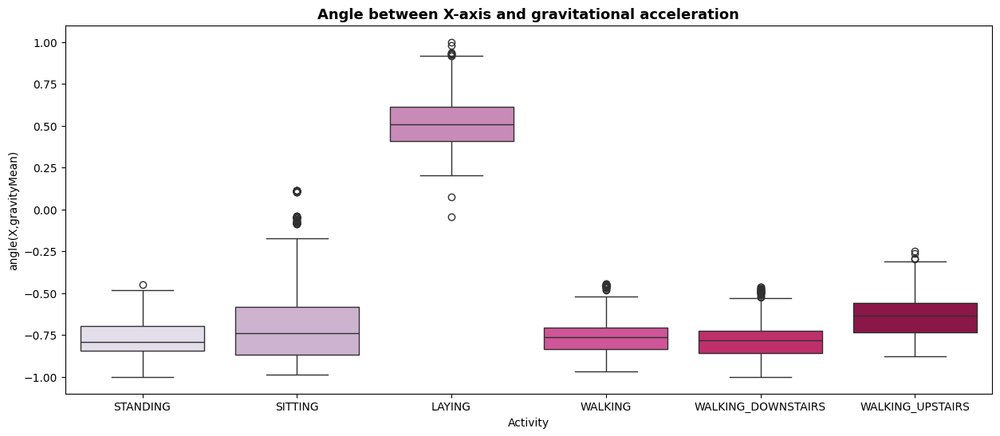

In [29]:
plt.figure(figsize = (15,6))
plt.title('Angle between X-axis and gravitational acceleration', fontsize='13', weight='bold')
sns.boxplot(train, x='Activity', y='angle(X,gravityMean)', palette='PuRd');

Как можно заметить, сильно выделяется категория laying. Могу предположить, что для остальных активностей мы должны находиться в вертикальном положении, поэтому угол между вектором ускорения и осью OX будет примерно в одинаковых границах, а для активности laying требуется горизонтальное положение.

Посмотрим теперь на `tBodyAcc-max()-X`.

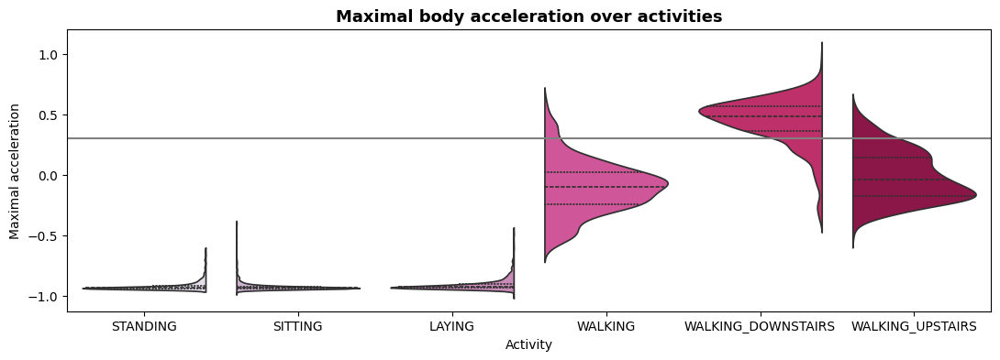

In [118]:
plt.figure(figsize = (13,4))
plt.title('Maximal body acceleration over activities', fontsize='13', weight='bold')
plt.ylabel('Maximal acceleration')
sns.violinplot(train, x='Activity', y='tBodyAcc-max()-X', scale='width', split=True, palette='PuRd', inner="quart");
plt.axhline(0.3, c='grey');

Как мы видим сильнее всего выделяется: walking downstairs - что логично, поскольку спускаться по лестнице в ускоренном темпе намного проще, чем просто поддерживать уксорение при ходьбе, а тем более при подъеме пот лестнице

Ранее уже упоминалось разделение на две группы активностей: статические и динамические. Пришла пора разделить датасет train на две части. Сделайте это! Теперь на одной картинке покажим распределения `fBodyAcc-bandsEnergy()-1,8.2` для динамичных активностей (boxenplot - немного измененый "ящик с усами") и `angle(Y,gravityMean)` для статических - тут хватит и простой гистограммы (прямо, как в примере ниже).

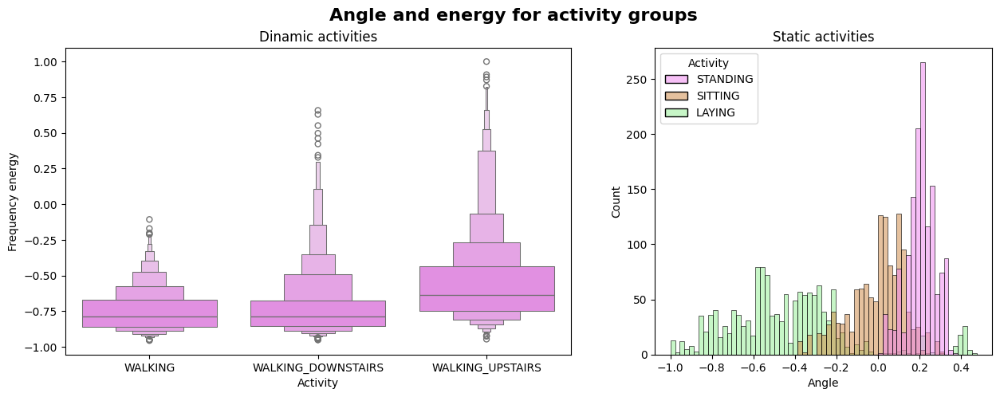

In [126]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5), gridspec_kw={'width_ratios': [3,2]})
fig.suptitle('Angle and energy for activity groups', weight='bold', fontsize=16)


sns.boxenplot(ax=ax1, data=train[train['Activity'].isin(options_1)], x='Activity', 
              y='fBodyAcc-bandsEnergy()-1,8.2', color='violet')
ax1.set_ylabel('Frequency energy')
ax1.set_title('Dinamic activities')


c = {"STANDING":'violet', "SITTING":'peru', "LAYING":'lightgreen'}
sns.histplot(data=train[train['Activity'].isin(options_2)], x='angle(Y,gravityMean)', ax=ax2, 
             hue='Activity', bins=65, palette=c)
ax2.set_xlabel('Angle')
ax2.set_title('Static activities');


Для динамический активностей: для walking upstairs >-0.5 около 30%, в то время как для остальных это около 10%. То есть walking upstair выделяется и имеет более растянутый хвост.

Для статичных активностей: существенно выделяется активность laying, на большом участке от -1 до -0.4 вообще встречается только эта активность.

Рассмотрим только статические активности. Будет снова два графика сразу. На первом графике будет боксплот распределения `fBodyAcc-skewness()-X` по активностям. А на втором попробуем взять не все наблюдения данной группы активностей, а только их часть.

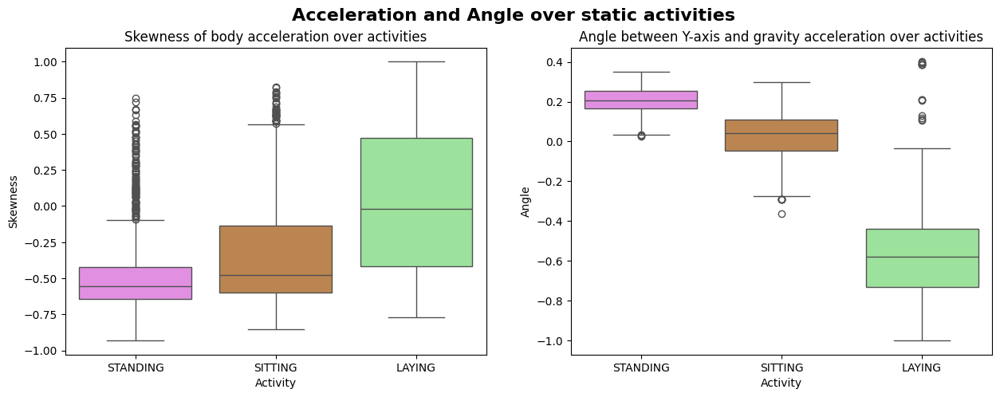

In [32]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))
fig.suptitle('Acceleration and Angle over static activities', weight='bold', fontsize=16)


c = {"STANDING":'violet', "SITTING":'peru', "LAYING":'lightgreen'}
sns.boxplot(ax=ax1, data=train[train['Activity'].isin(options_2)], x='Activity', 
              y='fBodyAcc-skewness()-X', palette=c)
ax1.set_ylabel('Skewness')
ax1.set_title('Skewness of body acceleration over activities')


sns.boxplot(data=train[train['Activity'].isin(options_2) & (train['fBodyAcc-skewness()-X'] < -0.376)], x='Activity',
             y='angle(Y,gravityMean)', ax=ax2, palette=c)
ax2.set_title('Angle between Y-axis and gravity acceleration over activities')
ax2.set_xlabel('Activity')
ax2.set_ylabel('Angle');

На первом графике видно, что для standing и sitting больше 75% меньше -0.15, в то время как для 60% значений laying будет больше -0.15

На втором графике мы видим сильную дифференцацию, поскольку 50% значений каждого распределения вообще не пересекаются.

Поздравляем, теперь вы на шажок ближе к тому, чтобы стать решающим деревом!

### Задание 14 (1 балл)

Вот и осталась лишь одна активность, которую мы никак не выделили. Попробуем и ее какими-то порогами отделить от всех остальных.

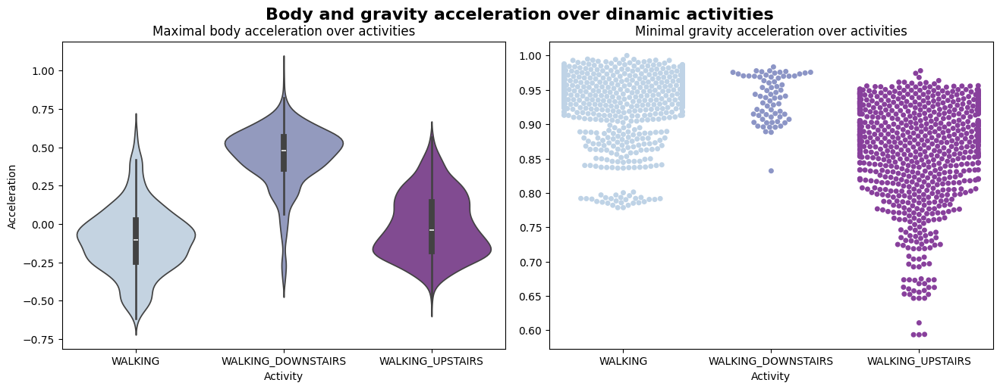

In [59]:
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(13, 5))
fig.suptitle('Body and gravity acceleration over dinamic activities', weight='bold', fontsize=16)
fig.tight_layout()

sns.violinplot(ax=ax1, data=train[train['Activity'].isin(options_1)], x='Activity', 
              y='tBodyAcc-max()-X', palette='BuPu')
ax1.set_ylabel('Acceleration')
ax1.set_title('Maximal body acceleration over activities')


sns.swarmplot(data=train[train['Activity'].isin(options_1) & (train['tBodyAcc-max()-X'] < 0.157)], x='Activity',
             y='tGravityAcc-min()-X', ax=ax2, palette='BuPu')
ax2.set_title('Minimal gravity acceleration over activities')
ax2.set_xlabel('Activity')
ax2.set_ylabel('');

Теперь попробуем более интерактивные графики. Установите библиотеку `plotly` (обычно `pip install plotly` или `conda install plotly`).
Сначала подготовим данные для визуализации.

In [ ]:
!pip install plotly

In [34]:
%%time
from sklearn.manifold import TSNE
tsne = TSNE(random_state=666, n_components=2)
new = tsne.fit_transform(train.drop(['subject', 'Activity'], axis=1))
df_2_comp = pd.concat([
    pd.DataFrame(new, columns=['x', 'y']),
    train['Activity']
], axis=1)

tsne = TSNE(random_state=666, n_components=3)
new = tsne.fit_transform(train.drop(['subject', 'Activity'], axis=1))
df_3_comp = pd.concat([
    pd.DataFrame(new, columns=['x', 'y', 'z']),
    train['Activity']
], axis=1)

CPU times: total: 15min 38s
Wall time: 2min 11s


Теперь нарисуйте scatter-график через `plotly.express` для `df_2_comp` с выделением цветами активностей. Красиво получилось? Видны скопления точек одного цвета? Можно разные активности отделить линиями на данном графике?

In [35]:
import plotly.express as px

px.scatter(df_2_comp, x='x', y='y', color='Activity', trendline='lowess')

Мы не отстаем от трендов и тоже можем в 3D.

In [36]:
px.scatter_3d(df_3_comp, x='x', y='y', z='z', color='Activity')

Напишем функцию, которая принимает на вход датафрейм с признаками, а выдает вектор из предсказаний - для каждой строки датафрейма вы определяете, к какому классу принадлежит объект.

In [172]:
def raw_prediction(raw):
    if raw['tBodyAccMag-mean()'] > -0.55: 
        if raw['tBodyAcc-max()-X'] > 0.4:
            return 'WALKING_DOWNSTAIRS'
        elif raw['tBodyAcc-max()-X'] < -0.3:
            return 'WALKING'
        elif raw['angle(X,gravityMean)'] > -0.7:
            return 'WALKING_UPSTAIRS' 
        else:
            if raw['tBodyAcc-max()-X'] < 0.3:
                return 'WALKING'
            else:
                return 'WALKING_DOWNSTAIRS'
    else:
        if raw['fBodyAcc-skewness()-X'] < -0.376 and raw['angle(Y,gravityMean)'] < -0.2:
            return 'LAYING'
        elif raw['fBodyAcc-skewness()-X'] > 0.3:
            return 'LAYING'
        elif raw['angle(Y,gravityMean)'] <= -0.4:
            return 'LAYING'
        elif -0.4 < raw['angle(Y,gravityMean)'] < 0:
            if raw['fBodyAcc-skewness()-X'] > 0:
                return 'LAYING'
            else:
                return 'SITTING'   
        else:
            if raw['fBodyAcc-skewness()-X'] > -0.4:
                return 'SITTING'
            else:
                return 'STANDING'

def predict(df: pd.DataFrame):
    y_pred = df.apply(raw_prediction, axis=1)
    return y_pred
    

def accuracy_score(y_true, y_pred) -> float:
    y_true = np.asarray(y_true).reshape(-1, 1)
    y_pred = np.asarray(y_pred).reshape(-1, 1)
    return (y_true == y_pred).mean()

In [173]:
train_preds = predict(train)
test_preds = predict(test)
print(f"Accuracy on train set => {accuracy_score(train['Activity'], train_preds)}")
print(f"Accuracy on test set => {accuracy_score(test['Activity'], test_preds)}")

Accuracy on train set => 0.7037540805223068
Accuracy on test set => 0.657278588394978
